Carga de paqueterias





# Carga e Instalación de paqueterías

In [ ]:
pip install dataprep

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import io
from google.colab import files
from dataprep.eda import create_report

# Carga de datos

In [ ]:
uploaded = files.upload()

Saving ACCOUNTS.csv to ACCOUNTS.csv


In [ ]:
uploaded = files.upload()

Saving DEMOGRAPHICS.csv to DEMOGRAPHICS.csv


In [ ]:
uploaded = files.upload()

Saving LOANS.csv to LOANS.csv


In [ ]:
accounts = pd.read_csv('ACCOUNTS.csv')  
accounts.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT
0,291655,-566.53,ALL_CREDITS_PAID_BACK,36.42,1.0
1,657079,-1673.16,CREDITS_PAID_TO_DATE,22.9,1.0
2,256050,NO_CHECKING,CREDITS_PAID_TO_DATE,450.35,2.0
3,1039151,-1471.03,PRIOR_PAYMENTS_DELAYED,805.71,2.0
4,1002660,NO_CHECKING,CREDITS_PAID_TO_DATE,295.03,1.0


In [ ]:
demog = pd.read_csv('DEMOGRAPHICS.csv')  
demog.head()

,ID,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION
0,24252,M,47.0,3.0,1.0,0.0,1.0,14.0,SAVINGS_INSURANCE,OWN,3.0
1,1002018,M,19.0,3.0,1.0,0.0,1.0,0.0,SAVINGS_INSURANCE,RENT,2.0
2,1240455,F,50.0,2.0,1.0,1.0,1.0,7.0,UNKNOWN,OWN,3.0
3,107799,M,35.0,3.0,1.0,0.0,1.0,0.0,REAL_ESTATE,OWN,2.0
4,184883,M,40.0,1.0,1.0,0.0,1.0,9.0,CAR_OTHER,OWN,4.0


In [ ]:
loans = pd.read_csv('LOANS.csv')  
loans.head()

,ID,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN,ALLOW
0,610339,713.0,STORES,3.0,CAR_USED,3103.0,NONE,1
1,109167,341.0,STORES,1.0,CAR_NEW,716.0,NONE,1
2,823322,868.0,NONE,4.0,APPLIANCES,4333.0,NONE,1
3,322224,310.0,STORES,2.0,FURNITURE,250.0,NONE,1
4,912693,620.0,NONE,2.0,CAR_USED,2454.0,NONE,0


#Informacion General de Datos

In [ ]:
#Accounts
accounts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2477 entries, 0 to 2476
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ID                      2477 non-null   int64  
 1   CHECKING_BALANCE        2467 non-null   object 
 2   CREDIT_HISTORY          2462 non-null   object 
 3   EXISTING_SAVINGS        2467 non-null   object 
 4   EXISTING_CREDITS_COUNT  2463 non-null   float64
dtypes: float64(1), int64(1), object(3)
memory usage: 96.9+ KB


In [ ]:
accounts.isnull().sum()

ID                         0
CHECKING_BALANCE          10
CREDIT_HISTORY            15
EXISTING_SAVINGS          10
EXISTING_CREDITS_COUNT    14
dtype: int64

In [ ]:
accounts.shape

(2477, 5)

In [ ]:
#Demographics
demog.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3936 entries, 0 to 3935
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          3936 non-null   int64  
 1   SEX                         3920 non-null   object 
 2   AGE                         3918 non-null   float64
 3   JOB_TYPE                    3910 non-null   float64
 4   DEPENDENTS                  3915 non-null   float64
 5   TELEPHONE                   3915 non-null   float64
 6   FOREIGN_WORKER              3909 non-null   float64
 7   EMPLOYMENT_DURATION         3923 non-null   float64
 8   PROPERTY                    3918 non-null   object 
 9   HOUSING                     3912 non-null   object 
 10  CURRENT_RESIDENCE_DURATION  3917 non-null   float64
dtypes: float64(7), int64(1), object(3)
memory usage: 338.4+ KB


In [ ]:
demog.isnull().sum()

ID                             0
SEX                           16
AGE                           18
JOB_TYPE                      26
DEPENDENTS                    21
TELEPHONE                     21
FOREIGN_WORKER                27
EMPLOYMENT_DURATION           13
PROPERTY                      18
HOUSING                       24
CURRENT_RESIDENCE_DURATION    19
dtype: int64

In [ ]:
demog.shape

(3936, 11)

In [ ]:
#Loans
loans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   3999 non-null   int64  
 1   PAYMENT_TERM         3975 non-null   float64
 2   INSTALLMENT_PLANS    3978 non-null   object 
 3   INSTALLMENT_PERCENT  3974 non-null   float64
 4   LOAN_PURPOSE         3979 non-null   object 
 5   LOAN_AMOUNT          3981 non-null   float64
 6   OTHERS_ON_LOAN       3977 non-null   object 
 7   ALLOW                3999 non-null   int64  
dtypes: float64(3), int64(2), object(3)
memory usage: 250.1+ KB


In [ ]:
loans.isnull().sum()

ID                      0
PAYMENT_TERM           24
INSTALLMENT_PLANS      21
INSTALLMENT_PERCENT    25
LOAN_PURPOSE           20
LOAN_AMOUNT            18
OTHERS_ON_LOAN         22
ALLOW                   0
dtype: int64

In [ ]:
loans.shape

(3999, 8)

# Limpieza de datos y EDA


In [ ]:
temp_df = demog.drop_duplicates(subset='ID')
df4 = accounts.merge(temp_df, left_on=['ID'], right_on=['ID'], how='left', suffixes=['_accounts', '_demog'])

In [ ]:
temp_df_1 = loans.drop_duplicates(subset='ID')
df5 = df4.merge(temp_df_1, left_on=['ID'], right_on=['ID'], how='left', suffixes=['_df4', '_loans'])

In [ ]:
df5.head()

,ID,CHECKING_BALANCE,CREDIT_HISTORY,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,SEX,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,PROPERTY,HOUSING,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PLANS,INSTALLMENT_PERCENT,LOAN_PURPOSE,LOAN_AMOUNT,OTHERS_ON_LOAN,ALLOW
0,291655,-566.53,ALL_CREDITS_PAID_BACK,36.42,1.0,F,24.0,3.0,1.0,1.0,1.0,0.0,SAVINGS_INSURANCE,OWN,2.0,310.0,NONE,2.0,CAR_NEW,3503.0,NONE,1
1,657079,-1673.16,CREDITS_PAID_TO_DATE,22.9,1.0,F,30.0,3.0,1.0,0.0,1.0,5.0,CAR_OTHER,RENT,1.0,630.0,STORES,3.0,CAR_NEW,3729.0,NONE,1
2,256050,NO_CHECKING,CREDITS_PAID_TO_DATE,450.35,2.0,M,40.0,3.0,1.0,0.0,1.0,4.0,UNKNOWN,OWN,4.0,868.0,NONE,3.0,CAR_USED,8516.0,NONE,0
3,1039151,-1471.03,PRIOR_PAYMENTS_DELAYED,805.71,2.0,M,28.0,1.0,1.0,0.0,1.0,0.0,CAR_OTHER,OWN,3.0,403.0,BANK,3.0,FURNITURE,2577.0,NONE,1
4,1002660,NO_CHECKING,CREDITS_PAID_TO_DATE,295.03,1.0,M,19.0,2.0,1.0,0.0,1.0,3.0,REAL_ESTATE,OWN,3.0,810.0,NONE,4.0,BUSINESS,3750.0,NONE,1


In [ ]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2477 entries, 0 to 2476
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          2477 non-null   int64  
 1   CHECKING_BALANCE            2467 non-null   object 
 2   CREDIT_HISTORY              2462 non-null   object 
 3   EXISTING_SAVINGS            2467 non-null   object 
 4   EXISTING_CREDITS_COUNT      2463 non-null   float64
 5   SEX                         2467 non-null   object 
 6   AGE                         2465 non-null   float64
 7   JOB_TYPE                    2464 non-null   float64
 8   DEPENDENTS                  2461 non-null   float64
 9   TELEPHONE                   2464 non-null   float64
 10  FOREIGN_WORKER              2463 non-null   float64
 11  EMPLOYMENT_DURATION         2472 non-null   float64
 12  PROPERTY                    2465 non-null   object 
 13  HOUSING                     2465 

In [ ]:
df5.isnull().sum()

ID                             0
CHECKING_BALANCE              10
CREDIT_HISTORY                15
EXISTING_SAVINGS              10
EXISTING_CREDITS_COUNT        14
SEX                           10
AGE                           12
JOB_TYPE                      13
DEPENDENTS                    16
TELEPHONE                     13
FOREIGN_WORKER                14
EMPLOYMENT_DURATION            5
PROPERTY                      12
HOUSING                       12
CURRENT_RESIDENCE_DURATION     8
PAYMENT_TERM                  17
INSTALLMENT_PLANS             15
INSTALLMENT_PERCENT           18
LOAN_PURPOSE                  10
LOAN_AMOUNT                   11
OTHERS_ON_LOAN                13
ALLOW                          0
dtype: int64

In [ ]:
create_report(df5)

In [ ]:
df5_corr = df5.corr()
df5_corr.head()

,ID,EXISTING_CREDITS_COUNT,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PERCENT,LOAN_AMOUNT,ALLOW
ID,1.000000,-0.003681,0.023974,-0.010856,-0.004616,0.024201,-0.022524,0.001050,0.049086,0.026887,0.016788,-0.004177,-0.027275
EXISTING_CREDITS_COUNT,-0.003681,1.000000,0.535793,0.011013,0.346115,0.423445,-0.062064,0.430031,0.438320,0.492686,0.511079,0.570590,-0.376202
AGE,0.023974,0.535793,1.000000,0.005003,0.326057,0.497406,-0.079097,0.550295,0.541102,0.531545,0.605835,0.638320,-0.453890
JOB_TYPE,-0.010856,0.011013,0.005003,1.000000,-0.047999,-0.075792,0.001795,0.019361,0.003022,-0.010756,-0.004404,-0.009829,-0.093958
DEPENDENTS,-0.004616,0.346115,0.326057,-0.047999,1.000000,0.340495,0.003452,0.241507,0.290842,0.298042,0.320457,0.354112,-0.217096


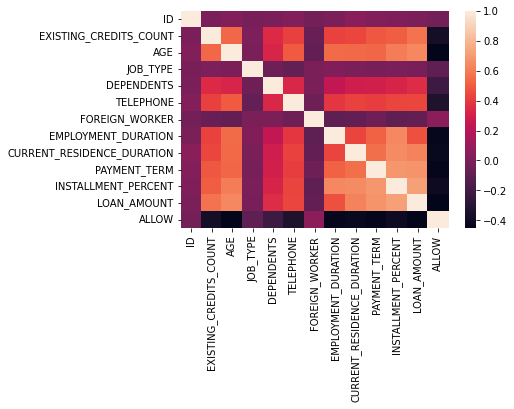

In [ ]:
sns.heatmap(df5_corr)
plt.show()

In [ ]:
df5.CHECKING_BALANCE = df5.CHECKING_BALANCE.replace('NO_CHECKING',np.NaN)
df5.EXISTING_SAVINGS = df5.EXISTING_SAVINGS.replace('UNKNOWN',np.NaN)

In [ ]:
df5.CHECKING_BALANCE = df5.CHECKING_BALANCE.astype(float)
df5.EXISTING_SAVINGS = df5.EXISTING_SAVINGS.astype(float)

In [ ]:
df5.describe()

,ID,CHECKING_BALANCE,EXISTING_SAVINGS,EXISTING_CREDITS_COUNT,AGE,JOB_TYPE,DEPENDENTS,TELEPHONE,FOREIGN_WORKER,EMPLOYMENT_DURATION,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PERCENT,LOAN_AMOUNT,ALLOW
count,2.477000e+03,1479.000000,2291.000000,2463.000000,2465.000000,2464.000000,2461.000000,2464.000000,2463.000000,2472.000000,2469.000000,2460.000000,2459.000000,2466.000000,2477.000000
mean,6.683799e+05,518.157309,1365.387067,1.469752,35.918053,2.415990,1.160504,0.409903,0.976045,4.209142,2.858647,659.310976,2.987393,3481.077048,0.659669
std,3.730570e+05,2789.131631,4764.641415,0.569142,10.528052,0.943945,0.367147,0.491915,0.152939,3.621336,1.101728,341.507224,1.123861,2502.752415,0.473916
min,9.800000e+01,-2797.250000,0.020000,1.000000,19.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,120.000000,1.000000,250.000000,0.000000
25%,3.521920e+05,-196.505000,64.725000,1.000000,28.000000,2.000000,1.000000,0.000000,1.000000,1.000000,2.000000,390.000000,2.000000,1349.250000,0.000000
50%,6.809460e+05,0.000000,265.990000,1.000000,36.000000,3.000000,1.000000,0.000000,1.000000,4.000000,3.000000,651.000000,3.000000,3206.000000,1.000000
75%,9.857560e+05,109.935000,733.945000,2.000000,43.000000,3.000000,1.000000,1.000000,1.000000,7.000000,4.000000,900.000000,4.000000,5280.250000,1.000000
max,1.319964e+06,28041.160000,50177.310000,3.000000,73.000000,3.000000,2.000000,1.000000,1.000000,18.000000,6.000000,1984.000000,6.000000,11676.000000,1.000000


In [ ]:
df5.dtypes

ID                              int64
CHECKING_BALANCE              float64
CREDIT_HISTORY                 object
EXISTING_SAVINGS              float64
EXISTING_CREDITS_COUNT        float64
SEX                            object
AGE                           float64
JOB_TYPE                      float64
DEPENDENTS                    float64
TELEPHONE                     float64
FOREIGN_WORKER                float64
EMPLOYMENT_DURATION           float64
PROPERTY                       object
HOUSING                        object
CURRENT_RESIDENCE_DURATION    float64
PAYMENT_TERM                  float64
INSTALLMENT_PLANS              object
INSTALLMENT_PERCENT           float64
LOAN_PURPOSE                   object
LOAN_AMOUNT                   float64
OTHERS_ON_LOAN                 object
ALLOW                           int64
dtype: object

In [ ]:
num_val = df5[['AGE', 'JOB_TYPE','DEPENDENTS',
               'FOREIGN_WORKER','EMPLOYMENT_DURATION',
               'CURRENT_RESIDENCE_DURATION','PAYMENT_TERM',
               'INSTALLMENT_PERCENT','LOAN_AMOUNT', 'ALLOW',
              'CHECKING_BALANCE','EXISTING_SAVINGS']]

num_val.head()

,AGE,JOB_TYPE,DEPENDENTS,FOREIGN_WORKER,EMPLOYMENT_DURATION,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PERCENT,LOAN_AMOUNT,ALLOW,CHECKING_BALANCE,EXISTING_SAVINGS
0,24.0,3.0,1.0,1.0,0.0,2.0,310.0,2.0,3503.0,1,-566.53,36.42
1,30.0,3.0,1.0,1.0,5.0,1.0,630.0,3.0,3729.0,1,-1673.16,22.90
2,40.0,3.0,1.0,1.0,4.0,4.0,868.0,3.0,8516.0,0,NaN,450.35
3,28.0,1.0,1.0,1.0,0.0,3.0,403.0,3.0,2577.0,1,-1471.03,805.71
4,19.0,2.0,1.0,1.0,3.0,3.0,810.0,4.0,3750.0,1,NaN,295.03


In [ ]:
num_val.mean(axis=0)

AGE                             35.918053
JOB_TYPE                         2.415990
DEPENDENTS                       1.160504
FOREIGN_WORKER                   0.976045
EMPLOYMENT_DURATION              4.209142
CURRENT_RESIDENCE_DURATION       2.858647
PAYMENT_TERM                   659.310976
INSTALLMENT_PERCENT              2.987393
LOAN_AMOUNT                   3481.077048
ALLOW                            0.659669
CHECKING_BALANCE               518.157309
EXISTING_SAVINGS              1365.387067
dtype: float64

In [ ]:
num_val["AGE"].replace(np.nan, num_val['AGE'].mean(axis=0), inplace=True)
num_val["JOB_TYPE"].replace(np.nan, num_val['JOB_TYPE'].mean(axis=0), inplace=True)
num_val["DEPENDENTS"].replace(np.nan, num_val['DEPENDENTS'].mean(axis=0), inplace=True)
num_val["FOREIGN_WORKER"].replace(np.nan, num_val['FOREIGN_WORKER'].mean(axis=0), inplace=True)
num_val["EMPLOYMENT_DURATION"].replace(np.nan, num_val['EMPLOYMENT_DURATION'].mean(axis=0), inplace=True)
num_val["CURRENT_RESIDENCE_DURATION"].replace(np.nan, num_val['CURRENT_RESIDENCE_DURATION'].mean(axis=0), inplace=True)
num_val["PAYMENT_TERM"].replace(np.nan, num_val['PAYMENT_TERM'].mean(axis=0), inplace=True)
num_val["INSTALLMENT_PERCENT"].replace(np.nan, num_val['INSTALLMENT_PERCENT'].mean(axis=0), inplace=True)
num_val["CHECKING_BALANCE"].replace(np.nan, num_val['CHECKING_BALANCE'].mean(axis=0), inplace=True)
num_val["EXISTING_SAVINGS"].replace(np.nan, num_val['EXISTING_SAVINGS'].mean(axis=0), inplace=True)
num_val["LOAN_AMOUNT"].replace(np.nan, num_val['LOAN_AMOUNT'].mean(axis=0), inplace=True)
num_val.head()

/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:4582: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


,AGE,JOB_TYPE,DEPENDENTS,FOREIGN_WORKER,EMPLOYMENT_DURATION,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PERCENT,LOAN_AMOUNT,ALLOW,CHECKING_BALANCE,EXISTING_SAVINGS
0,24.0,3.0,1.0,1.0,0.0,2.0,310.0,2.0,3503.0,1,-566.530000,36.42
1,30.0,3.0,1.0,1.0,5.0,1.0,630.0,3.0,3729.0,1,-1673.160000,22.90
2,40.0,3.0,1.0,1.0,4.0,4.0,868.0,3.0,8516.0,0,518.157309,450.35
3,28.0,1.0,1.0,1.0,0.0,3.0,403.0,3.0,2577.0,1,-1471.030000,805.71
4,19.0,2.0,1.0,1.0,3.0,3.0,810.0,4.0,3750.0,1,518.157309,295.03


In [ ]:
num_val.drop_duplicates(inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


DataPrep Report
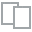
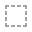
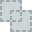
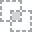
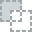
...
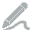
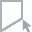
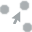
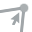
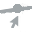

In [ ]:
create_report(num_val)

In [ ]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2477 entries, 0 to 2476
Data columns (total 22 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          2477 non-null   int64  
 1   CHECKING_BALANCE            1479 non-null   float64
 2   CREDIT_HISTORY              2462 non-null   object 
 3   EXISTING_SAVINGS            2291 non-null   float64
 4   EXISTING_CREDITS_COUNT      2463 non-null   float64
 5   SEX                         2467 non-null   object 
 6   AGE                         2465 non-null   float64
 7   JOB_TYPE                    2464 non-null   float64
 8   DEPENDENTS                  2461 non-null   float64
 9   TELEPHONE                   2464 non-null   float64
 10  FOREIGN_WORKER              2463 non-null   float64
 11  EMPLOYMENT_DURATION         2472 non-null   float64
 12  PROPERTY                    2465 non-null   object 
 13  HOUSING                     2465 

In [ ]:
catg_val = df5[['SEX','PROPERTY','HOUSING','LOAN_PURPOSE',
               'OTHERS_ON_LOAN','ALLOW']]

catg_val.head()

,SEX,PROPERTY,HOUSING,LOAN_PURPOSE,OTHERS_ON_LOAN,ALLOW
0,F,SAVINGS_INSURANCE,OWN,CAR_NEW,NONE,1
1,F,CAR_OTHER,RENT,CAR_NEW,NONE,1
2,M,UNKNOWN,OWN,CAR_USED,NONE,0
3,M,CAR_OTHER,OWN,FURNITURE,NONE,1
4,M,REAL_ESTATE,OWN,BUSINESS,NONE,1


In [ ]:
catg_val = pd.get_dummies(catg_val)
catg_val.head()

,ALLOW,SEX_F,SEX_M,PROPERTY_CAR_OTHER,PROPERTY_REAL_ESTATE,PROPERTY_SAVINGS_INSURANCE,PROPERTY_UNKNOWN,HOUSING_FREE,HOUSING_OWN,HOUSING_RENT,LOAN_PURPOSE_APPLIANCES,LOAN_PURPOSE_BUSINESS,LOAN_PURPOSE_CAR_NEW,LOAN_PURPOSE_CAR_USED,LOAN_PURPOSE_EDUCATION,LOAN_PURPOSE_FURNITURE,LOAN_PURPOSE_OTHER,LOAN_PURPOSE_RADIO_TV,LOAN_PURPOSE_REPAIRS,LOAN_PURPOSE_RETRAINING,LOAN_PURPOSE_VACATION,OTHERS_ON_LOAN_CO-APPLICANT,OTHERS_ON_LOAN_GUARANTOR,OTHERS_ON_LOAN_NONE
0,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1,1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1
2,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3,1,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
4,1,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
create_report(catg_val)

E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'LOAN_PURPOSE_...ION'


In [ ]:
catg_val_corr = catg_val.corr()
catg_val_corr.head()

,ALLOW,SEX_F,SEX_M,PROPERTY_CAR_OTHER,PROPERTY_REAL_ESTATE,PROPERTY_SAVINGS_INSURANCE,PROPERTY_UNKNOWN,HOUSING_FREE,HOUSING_OWN,HOUSING_RENT,LOAN_PURPOSE_APPLIANCES,LOAN_PURPOSE_BUSINESS,LOAN_PURPOSE_CAR_NEW,LOAN_PURPOSE_CAR_USED,LOAN_PURPOSE_EDUCATION,LOAN_PURPOSE_FURNITURE,LOAN_PURPOSE_OTHER,LOAN_PURPOSE_RADIO_TV,LOAN_PURPOSE_REPAIRS,LOAN_PURPOSE_RETRAINING,LOAN_PURPOSE_VACATION,OTHERS_ON_LOAN_CO-APPLICANT,OTHERS_ON_LOAN_GUARANTOR,OTHERS_ON_LOAN_NONE
ALLOW,1.000000,0.075318,-0.075876,-0.099746,0.310322,0.103693,-0.371132,-0.337219,0.042330,0.241005,-0.140150,0.000835,0.208980,0.055265,-0.008548,0.021102,-0.099881,-0.077887,-0.118116,0.026669,0.007310,-0.286006,-0.131497,0.319221
SEX_F,0.075318,1.000000,-0.991512,-0.058605,0.111598,0.045450,-0.116098,-0.126391,0.012244,0.095887,-0.042527,-0.025889,0.112697,0.014236,0.006342,0.000675,-0.046356,-0.049667,-0.088254,0.018522,0.040915,-0.113829,-0.047234,0.128888
SEX_M,-0.075876,-0.991512,1.000000,0.055027,-0.111234,-0.044725,0.119277,0.127177,-0.011481,-0.097561,0.045467,0.022295,-0.112719,-0.015116,-0.004815,-0.003685,0.047443,0.048350,0.090133,-0.016962,-0.039015,0.116979,0.042826,-0.130180
PROPERTY_CAR_OTHER,-0.099746,-0.058605,0.055027,1.000000,-0.340347,-0.474029,-0.273722,0.038982,0.092942,-0.139611,0.077719,0.027202,-0.135298,-0.023070,0.011988,0.022024,0.012229,0.030961,0.034017,0.025165,-0.008452,0.019690,0.016456,-0.027160
PROPERTY_REAL_ESTATE,0.310322,0.111598,-0.111234,-0.340347,1.000000,-0.363797,-0.210070,-0.183825,-0.134535,0.313606,-0.127684,-0.069883,0.285989,0.029865,0.008067,-0.036777,-0.072604,-0.097701,-0.058161,-0.037954,0.020873,-0.116703,-0.050921,0.133129


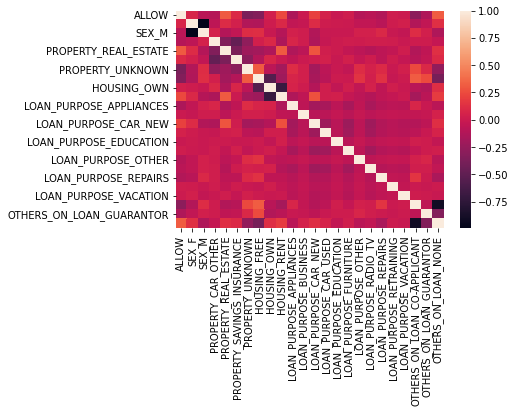

In [ ]:
sns.heatmap(catg_val_corr)
plt.show()

# Selección de Variables

In [ ]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

In [ ]:
num_val.columns

Index(['AGE', 'JOB_TYPE', 'DEPENDENTS', 'FOREIGN_WORKER',
       'EMPLOYMENT_DURATION', 'CURRENT_RESIDENCE_DURATION', 'PAYMENT_TERM',
       'INSTALLMENT_PERCENT', 'LOAN_AMOUNT', 'ALLOW', 'CHECKING_BALANCE',
       'EXISTING_SAVINGS'],
      dtype='object')

In [ ]:
X_num = num_val[['AGE', 'JOB_TYPE', 'DEPENDENTS', 'FOREIGN_WORKER',
       'EMPLOYMENT_DURATION', 'CURRENT_RESIDENCE_DURATION', 'PAYMENT_TERM',
       'INSTALLMENT_PERCENT', 'LOAN_AMOUNT','CHECKING_BALANCE',
       'EXISTING_SAVINGS']]

In [ ]:
y = num_val.ALLOW

In [ ]:
scaling = MinMaxScaler()

In [ ]:
X_num = scaling.fit_transform(X_num)
X_num[0:5]

array([[9.25925926e-02, 1.00000000e+00, 0.00000000e+00, 1.00000000e+00,
        0.00000000e+00, 2.00000000e-01, 1.01931330e-01, 2.00000000e-01,
        2.84701558e-01, 7.23357657e-02, 7.25427778e-04],
       [2.03703704e-01, 1.00000000e+00, 0.00000000e+00, 1.00000000e+00,
        2.77777778e-01, 0.00000000e+00, 2.73605150e-01, 4.00000000e-01,
        3.04481008e-01, 3.64509714e-02, 4.55983175e-04],
       [3.88888889e-01, 1.00000000e+00, 0.00000000e+00, 1.00000000e+00,
        2.22222222e-01, 6.00000000e-01, 4.01287554e-01, 4.00000000e-01,
        7.23437773e-01, 1.07509022e-01, 8.97477723e-03],
       [1.66666667e-01, 3.33333333e-01, 0.00000000e+00, 1.00000000e+00,
        0.00000000e+00, 4.00000000e-01, 1.51824034e-01, 4.00000000e-01,
        2.03658323e-01, 4.30054597e-02, 1.60568656e-02],
       [0.00000000e+00, 6.66666667e-01, 0.00000000e+00, 1.00000000e+00,
        1.66666667e-01, 4.00000000e-01, 3.70171674e-01, 6.00000000e-01,
        3.06318922e-01, 1.07509022e-01, 5.87935299e-

In [ ]:
X_num.shape

(2477, 11)

In [ ]:
X1_num = pd.DataFrame(X_num, columns= ['AGE', 'JOB_TYPE', 'DEPENDENTS', 'FOREIGN_WORKER',
       'EMPLOYMENT_DURATION', 'CURRENT_RESIDENCE_DURATION', 'PAYMENT_TERM',
       'INSTALLMENT_PERCENT', 'LOAN_AMOUNT','CHECKING_BALANCE',
       'EXISTING_SAVINGS'])
X1_num.head()

,AGE,JOB_TYPE,DEPENDENTS,FOREIGN_WORKER,EMPLOYMENT_DURATION,CURRENT_RESIDENCE_DURATION,PAYMENT_TERM,INSTALLMENT_PERCENT,LOAN_AMOUNT,CHECKING_BALANCE,EXISTING_SAVINGS
0,0.092593,1.000000,0.0,1.0,0.000000,0.2,0.101931,0.2,0.284702,0.072336,0.000725
1,0.203704,1.000000,0.0,1.0,0.277778,0.0,0.273605,0.4,0.304481,0.036451,0.000456
2,0.388889,1.000000,0.0,1.0,0.222222,0.6,0.401288,0.4,0.723438,0.107509,0.008975
3,0.166667,0.333333,0.0,1.0,0.000000,0.4,0.151824,0.4,0.203658,0.043005,0.016057
4,0.000000,0.666667,0.0,1.0,0.166667,0.4,0.370172,0.6,0.306319,0.107509,0.005879


In [ ]:
bestfeatures = SelectKBest(score_func=chi2, k=5)
fit = bestfeatures.fit(X1_num,y)

In [ ]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X1_num.columns)

In [ ]:
num_featureScores = pd.concat([dfcolumns,dfscores],axis=1)
num_featureScores.columns = ['Specs','Score']

In [ ]:
num_featureScores.sort_values(by= 'Score', ascending=False)

,Specs,Score
2,DEPENDENTS,96.934547
8,LOAN_AMOUNT,84.745976
4,EMPLOYMENT_DURATION,80.802606
0,AGE,61.327653
5,CURRENT_RESIDENCE_DURATION,57.811027
6,PAYMENT_TERM,55.377158
7,INSTALLMENT_PERCENT,50.931482
10,EXISTING_SAVINGS,12.717356
1,JOB_TYPE,2.661231
9,CHECKING_BALANCE,1.736410


In [ ]:
catg_val.columns

Index(['ALLOW', 'SEX_F', 'SEX_M', 'PROPERTY_CAR_OTHER', 'PROPERTY_REAL_ESTATE',
       'PROPERTY_SAVINGS_INSURANCE', 'PROPERTY_UNKNOWN', 'HOUSING_FREE',
       'HOUSING_OWN', 'HOUSING_RENT', 'LOAN_PURPOSE_APPLIANCES',
       'LOAN_PURPOSE_BUSINESS', 'LOAN_PURPOSE_CAR_NEW',
       'LOAN_PURPOSE_CAR_USED', 'LOAN_PURPOSE_EDUCATION',
       'LOAN_PURPOSE_FURNITURE', 'LOAN_PURPOSE_OTHER', 'LOAN_PURPOSE_RADIO_TV',
       'LOAN_PURPOSE_REPAIRS', 'LOAN_PURPOSE_RETRAINING',
       'LOAN_PURPOSE_VACATION', 'OTHERS_ON_LOAN_CO-APPLICANT',
       'OTHERS_ON_LOAN_GUARANTOR', 'OTHERS_ON_LOAN_NONE'],
      dtype='object')

In [ ]:
X_catg = catg_val[[ 'SEX_F', 'SEX_M', 'PROPERTY_CAR_OTHER', 'PROPERTY_REAL_ESTATE',
       'PROPERTY_SAVINGS_INSURANCE', 'PROPERTY_UNKNOWN', 'HOUSING_FREE',
       'HOUSING_OWN', 'HOUSING_RENT', 'LOAN_PURPOSE_APPLIANCES',
       'LOAN_PURPOSE_BUSINESS', 'LOAN_PURPOSE_CAR_NEW',
       'LOAN_PURPOSE_CAR_USED', 'LOAN_PURPOSE_EDUCATION',
       'LOAN_PURPOSE_FURNITURE', 'LOAN_PURPOSE_OTHER', 'LOAN_PURPOSE_RADIO_TV',
       'LOAN_PURPOSE_REPAIRS', 'LOAN_PURPOSE_RETRAINING',
       'LOAN_PURPOSE_VACATION', 'OTHERS_ON_LOAN_CO-APPLICANT',
       'OTHERS_ON_LOAN_GUARANTOR', 'OTHERS_ON_LOAN_NONE']]
X_catg.head()

,SEX_F,SEX_M,PROPERTY_CAR_OTHER,PROPERTY_REAL_ESTATE,PROPERTY_SAVINGS_INSURANCE,PROPERTY_UNKNOWN,HOUSING_FREE,HOUSING_OWN,HOUSING_RENT,LOAN_PURPOSE_APPLIANCES,LOAN_PURPOSE_BUSINESS,LOAN_PURPOSE_CAR_NEW,LOAN_PURPOSE_CAR_USED,LOAN_PURPOSE_EDUCATION,LOAN_PURPOSE_FURNITURE,LOAN_PURPOSE_OTHER,LOAN_PURPOSE_RADIO_TV,LOAN_PURPOSE_REPAIRS,LOAN_PURPOSE_RETRAINING,LOAN_PURPOSE_VACATION,OTHERS_ON_LOAN_CO-APPLICANT,OTHERS_ON_LOAN_GUARANTOR,OTHERS_ON_LOAN_NONE
0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1
1,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1
2,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3,0,1,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
4,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
bestfeatures_1 = SelectKBest(score_func=chi2, k=5)
fit1 = bestfeatures.fit(X_catg,y)

In [ ]:
dfscores1 = pd.DataFrame(fit1.scores_)
dfcolumns1 = pd.DataFrame(X_catg.columns)

In [ ]:
catg_featureScores = pd.concat([dfcolumns1,dfscores1],axis=1)
catg_featureScores.columns = ['Specs','Score']

In [ ]:
catg_featureScores.sort_values(by= 'Score', ascending=False)

,Specs,Score
5,PROPERTY_UNKNOWN,291.869356
6,HOUSING_FREE,241.193186
3,PROPERTY_REAL_ESTATE,189.133241
20,OTHERS_ON_LOAN_CO-APPLICANT,173.824375
8,HOUSING_RENT,113.843565
11,LOAN_PURPOSE_CAR_NEW,87.782113
9,LOAN_PURPOSE_APPLIANCES,42.937373
22,OTHERS_ON_LOAN_NONE,42.900743
21,OTHERS_ON_LOAN_GUARANTOR,41.862631
17,LOAN_PURPOSE_REPAIRS,32.562612


# Logisitic Regretion

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [ ]:
num_X = X1_num[['DEPENDENTS', 'LOAN_AMOUNT', 'EMPLOYMENT_DURATION']]
num_X.head()

,DEPENDENTS,LOAN_AMOUNT,EMPLOYMENT_DURATION
0,0.0,0.284702,0.000000
1,0.0,0.304481,0.277778
2,0.0,0.723438,0.222222
3,0.0,0.203658,0.000000
4,0.0,0.306319,0.166667


In [ ]:
X_train, X_test, y_train, y_test = train_test_split( num_X, y, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (1981, 3) (1981,)
Test set: (496, 3) (496,)


In [ ]:
LR = LogisticRegression(C=0.01, solver='liblinear').fit(X_train,y_train)
LR

LogisticRegression(C=0.01, solver='liblinear')

In [ ]:
yhat = LR.predict(X_test)
yhat[0:5]

array([1, 0, 1, 0, 1])

In [ ]:
yhat_prob = LR.predict_proba(X_test)
yhat_prob[0:5]

array([[0.39598152, 0.60401848],
       [0.50941487, 0.49058513],
       [0.31393684, 0.68606316],
       [0.51844609, 0.48155391],
       [0.43239366, 0.56760634]])

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
print(confusion_matrix(y_test, yhat, labels=[1,0]))

[[334   5]
 [132  25]]


Confusion matrix, without normalization
[[334   5]
 [132  25]]


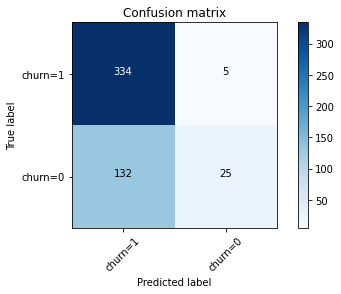

In [ ]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y_test, yhat, labels=[1,0])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['churn=1','churn=0'],normalize= False,  title='Confusion matrix')

In [ ]:
LR.score(X_test,y_test)

0.7237903225806451

In [ ]:
accuracy_score(y_test, yhat)

0.7237903225806451